# Look through the data we have

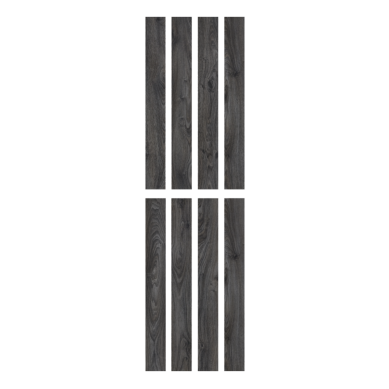

In [29]:
# Import libs
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
image_path = '../data/floor/82738268_06.png'
img = mpimg.imread(image_path)

# Plot the image
plt.imshow(img)
plt.axis('off')
plt.show()

# Some 'strange' examples

In our dataset, we have the following picture: `13.png`. It has an alpha channel and it was impossible to cut out the boards from it without proper handling:

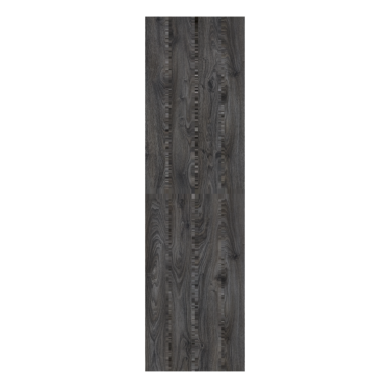

Image has an alpha channel


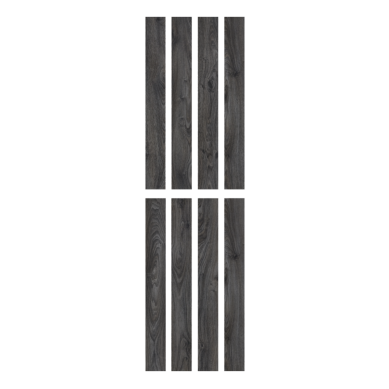

In [30]:
import cv2
import matplotlib.pyplot as plt

# Read the image
image_path = '../data/floor/82738268_06.png'
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)

# Display the image - it has 'artifacts'
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

# Read the image with alpha channel
img = cv2.imread('../data/floor/82738268_06.png', cv2.IMREAD_UNCHANGED)
# Check if the image has an alpha channel
if img.shape[2] == 4:
    print("Image has an alpha channel")
    # Convert to RGB (with the alpha channel)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)
else:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image - no more 'artifacts'
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

In [32]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def extract_boards(file_path):
    image = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)

    # Minimum width and height of contours we want to extract
    min_width = image.shape[1] // 20
    min_height = image.shape[0] // 5

    # Calculations of kernel sizes for blur and closing
    radius_w = image.shape[1] // 300 - (image.shape[1] // 300) % 2 + 1
    radius_h = image.shape[0] // 300 - (image.shape[0] // 300) % 2 + 1
    
    # Handling of alpha channel
    if image.shape[2] == 4:
        print('alpha channel')
        rgb = cv2.cvtColor(image[:, :, :3], cv2.COLOR_BGR2RGB)
        rgb = np.ascontiguousarray(rgb, dtype=np.uint8)
        alpha = image[:, :, 3]
        gray = cv2.cvtColor(rgb, cv2.COLOR_BGR2GRAY)
        gray = cv2.merge([gray, gray, gray, alpha])
    else:
        print('no alpha channel')
        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        gray = image

    # Blurring and closing the image -> better Canny edge detection
    blurred = cv2.GaussianBlur(gray, (radius_h, radius_w), 0)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (radius_h, radius_w))
    closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel)

    plt.imshow(closed)
    plt.axis('off')
    plt.show()
    
    # Detecting edges and contours
    edged = cv2.Canny(closed, 30, 225)
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    boards = []     
    for i, contour in enumerate(contours):

        # Extracting the bounding box and checking its size
        x, y, w, h = cv2.boundingRect(contour)
        if w >= min_width and h >= min_height:

            # Extracting boards
            board = image[y:y+h, x:x+w]
            boards.append(board)

            cv2.rectangle(rgb, (x, y), (x+w, y+h), (255, 0, 0), radius_w)
    if image.shape[2] == 4:
        rgb = cv2.merge((rgb, alpha))
    plt.imshow(rgb)
    plt.axis('off')
    plt.show()
    return boards

alpha channel


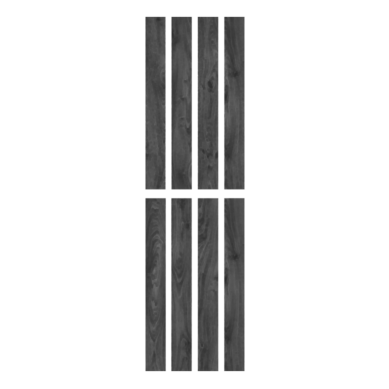

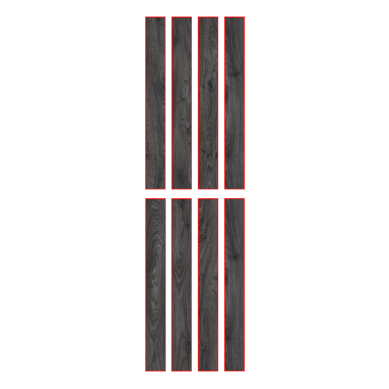

no alpha channel


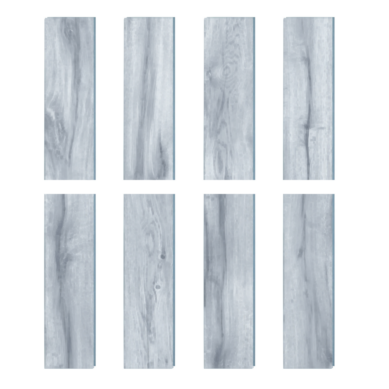

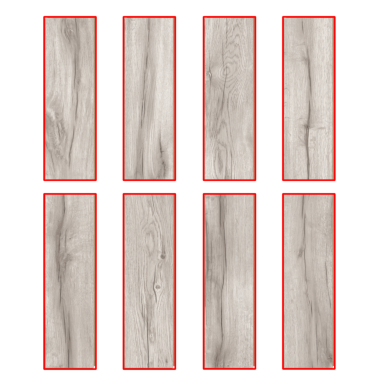

In [33]:
boards1 = extract_boards('../data/floor/82738268_06.png')
boards15 = extract_boards('../data/floor/88657712_03.jpg')

We observe that now, we can extract boards from pictures with alpha channels and without them.

# Prepare a dataset

../data/floor\7th-Heaven-Single-Panel-Template-ALTA-LAKE-EC8266.jpg
no alpha channel


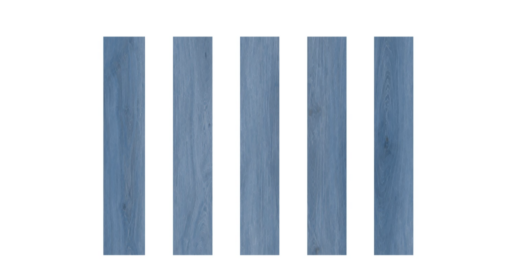

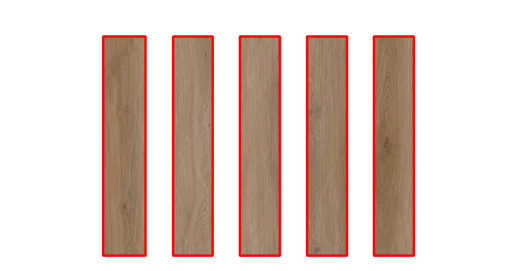

../data/floor\7th-Heaven-Single-Panel-Template-BRANDYWINE-FALLS-EC8270.jpg
no alpha channel


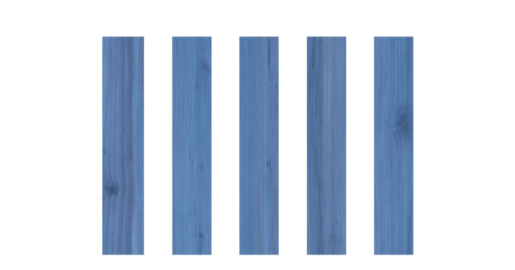

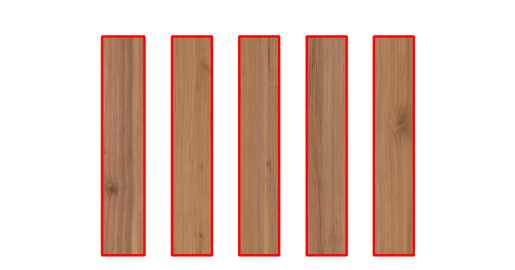

../data/floor\7th-Heaven-Single-Panel-Template-BRITANNIA-BEACH-EC8267.jpg
no alpha channel


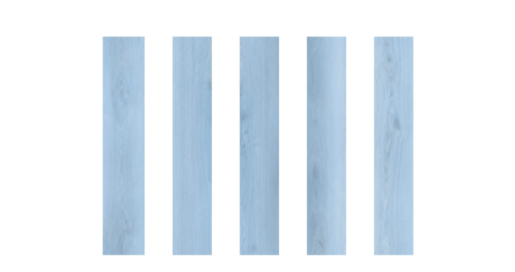

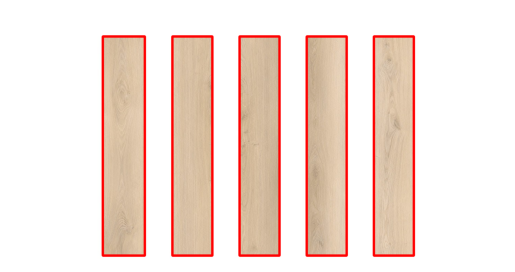

../data/floor\7th-Heaven-Single-Panel-Template-Emerald-Ridge.jpg
no alpha channel


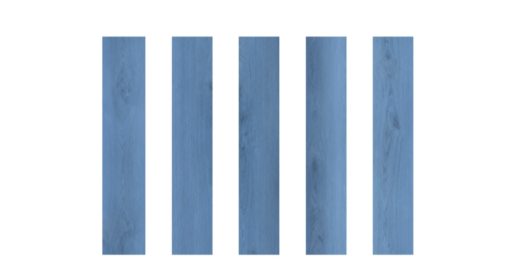

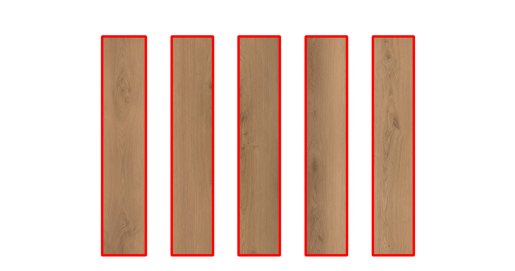

../data/floor\7th-Heaven-Single-Panel-Template-FURRY-CREEK-EC8262.jpg
no alpha channel


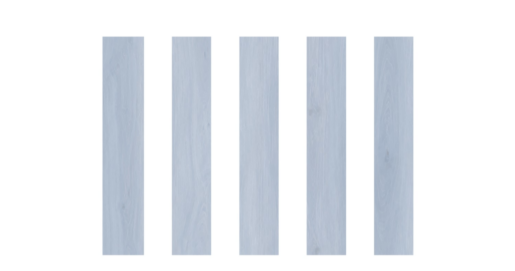

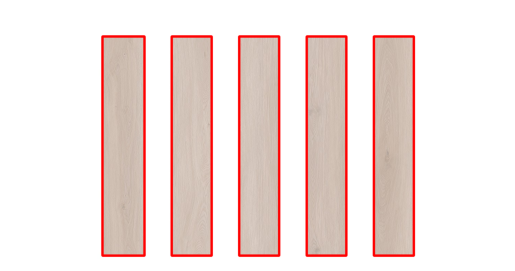

../data/floor\7th-Heaven-Single-Panel-Template-GARIBALDI-EC8261.jpg
no alpha channel


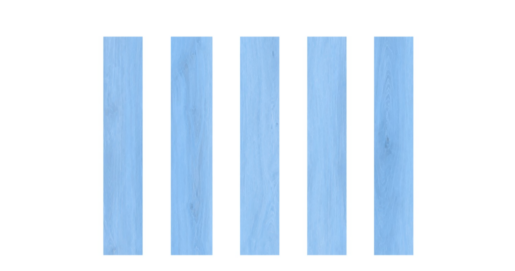

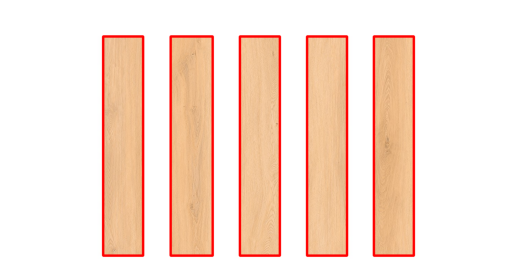

../data/floor\7th-Heaven-Single-Panel-Template-LAKE-SARAH-EC8263.jpg
no alpha channel


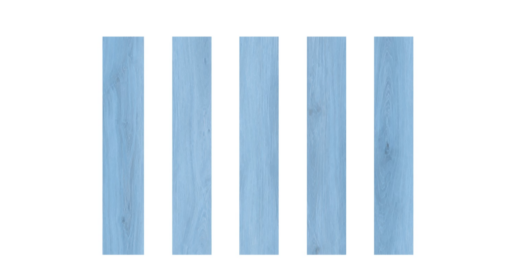

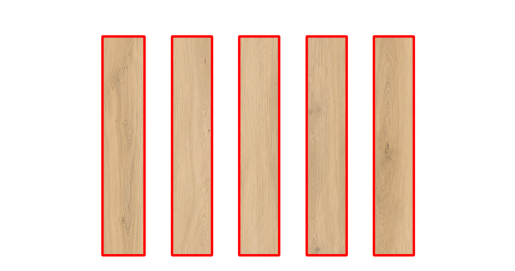

../data/floor\7th-Heaven-Single-Panel-Template-LOST-LAKE-EC8265.jpg
no alpha channel


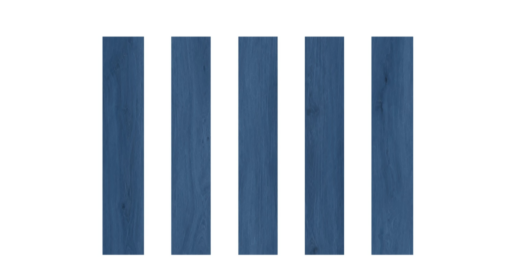

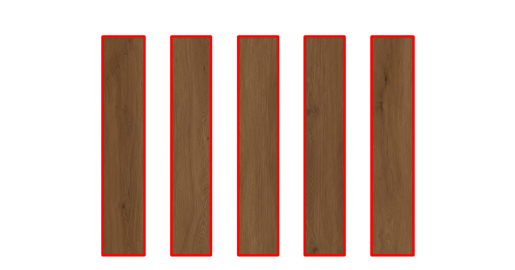

../data/floor\7th-Heaven-Single-Panel-Template-PANORAMA-EC8264.jpg
no alpha channel


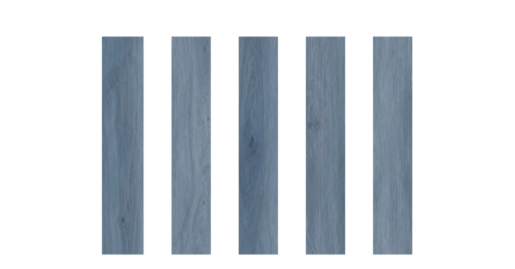

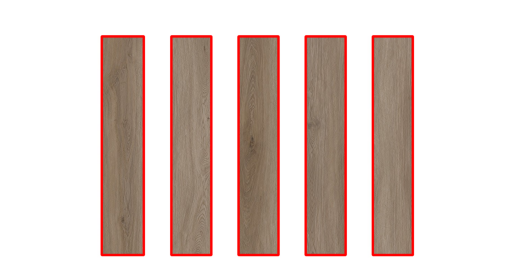

../data/floor\7th-Heaven-Single-Panel-Template-SHANNON-FALLS-EC8269.jpg
no alpha channel


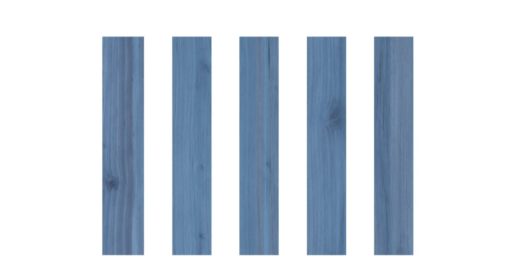

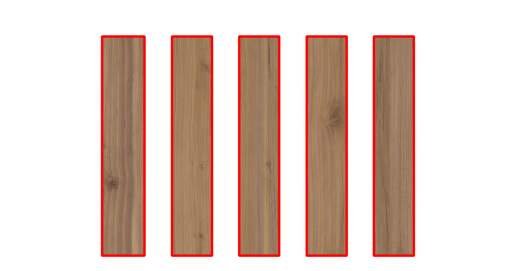

../data/floor\82738268_06.png
alpha channel


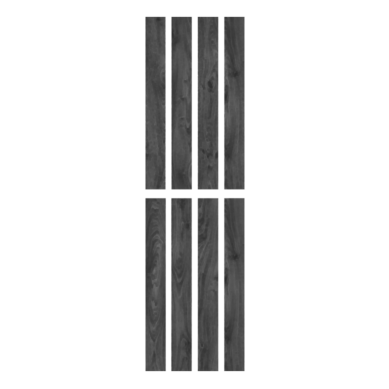

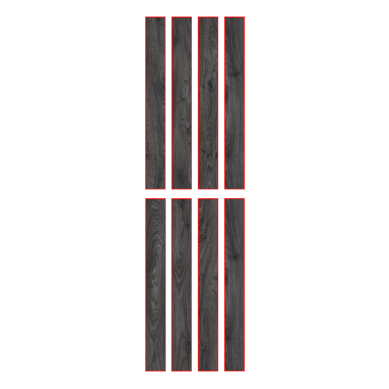

../data/floor\82738269_06.png
alpha channel


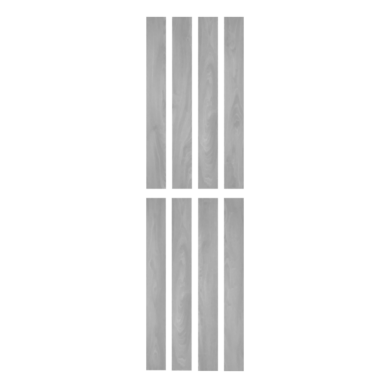

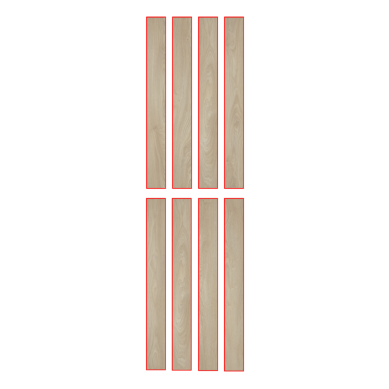

../data/floor\82738270_06.png
alpha channel


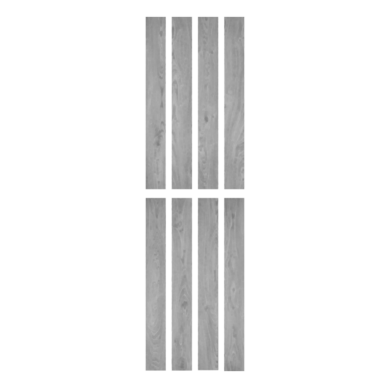

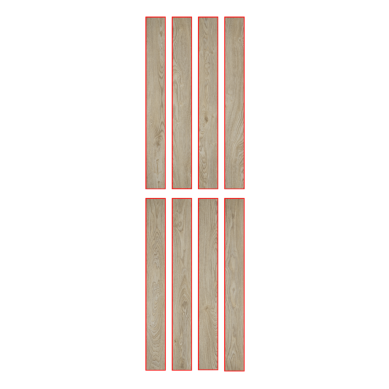

../data/floor\82738271_06.png
alpha channel


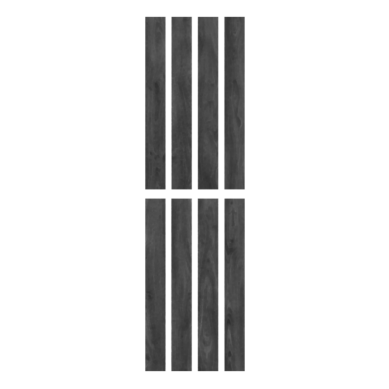

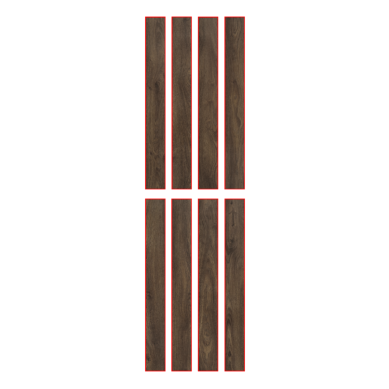

../data/floor\82738272_05.png
alpha channel


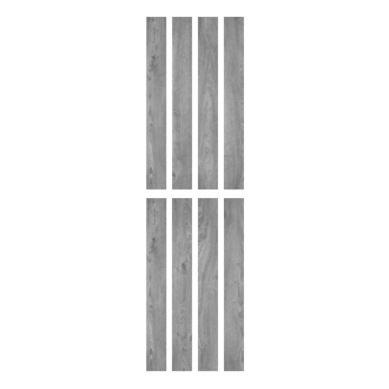

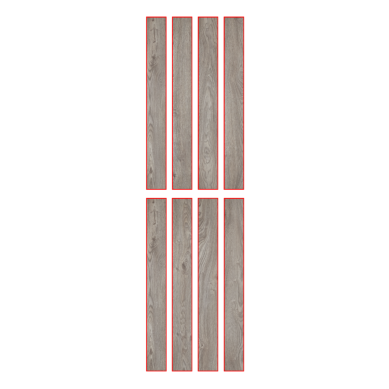

../data/floor\82738273_06.png
alpha channel


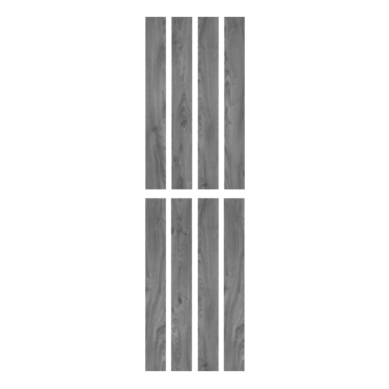

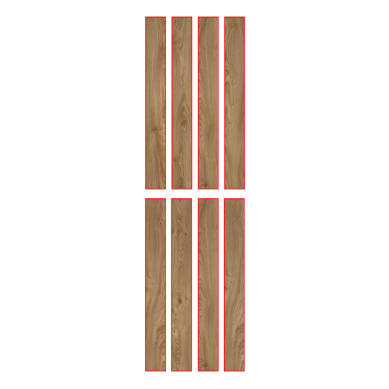

../data/floor\82738280_06.png
alpha channel


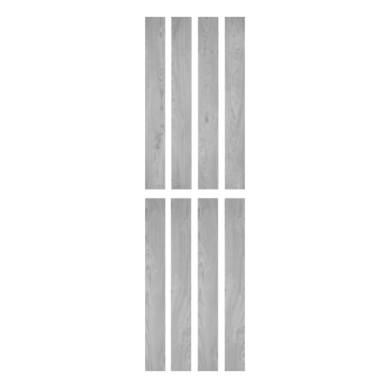

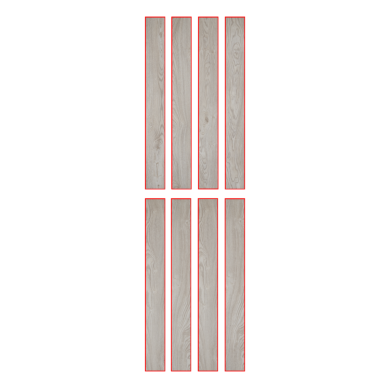

../data/floor\85342295_05.png
alpha channel


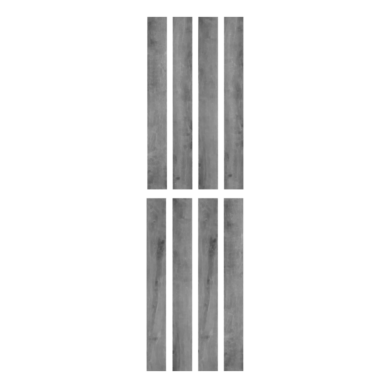

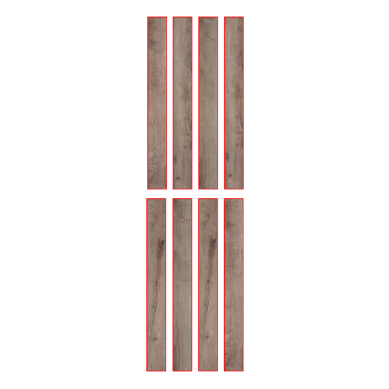

../data/floor\85468545_05.png
alpha channel


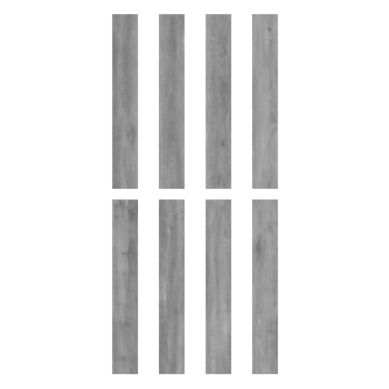

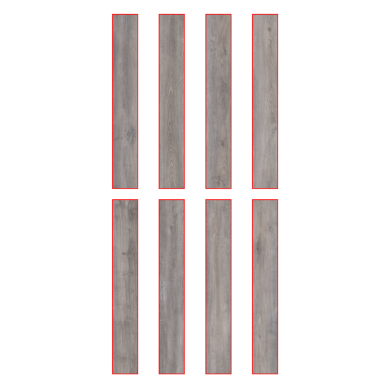

../data/floor\86481394_05.png
alpha channel


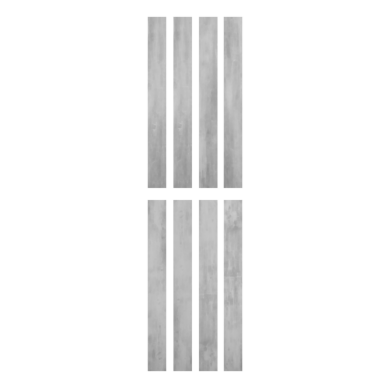

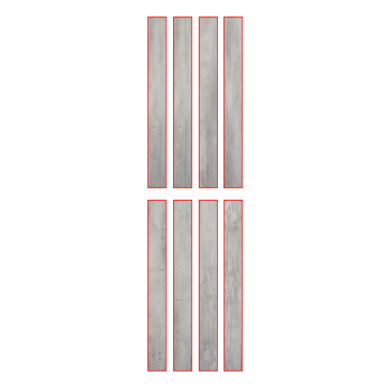

../data/floor\86481395_05.png
alpha channel


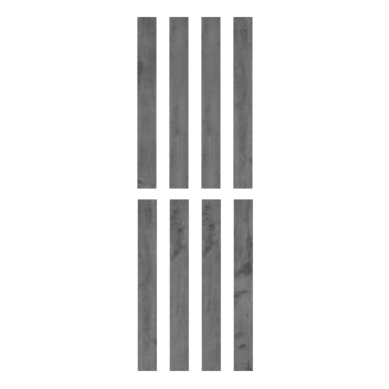

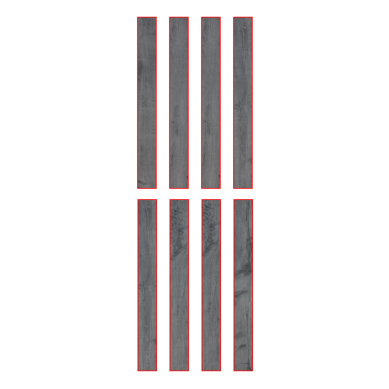

../data/floor\86481396_05.png
alpha channel


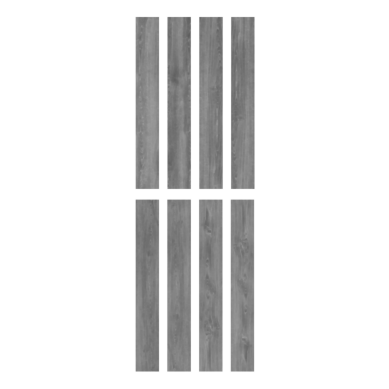

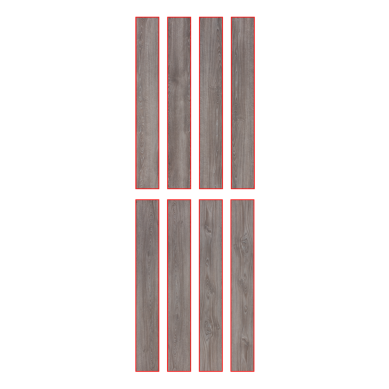

../data/floor\88109655_06.png
alpha channel


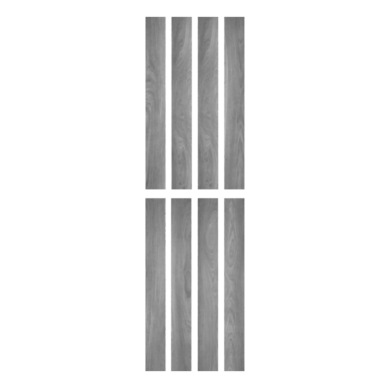

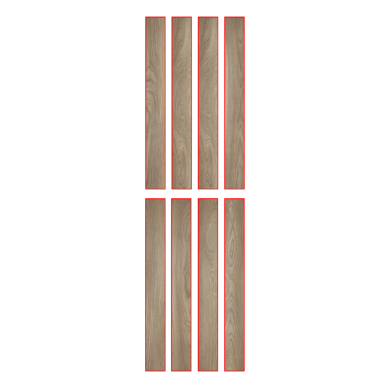

../data/floor\88109656_06.png
alpha channel


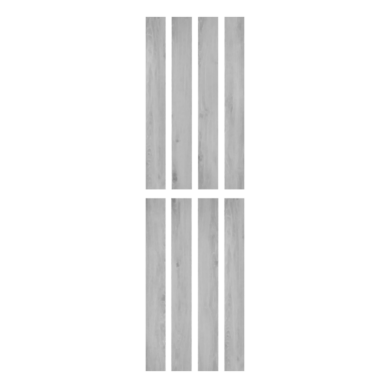

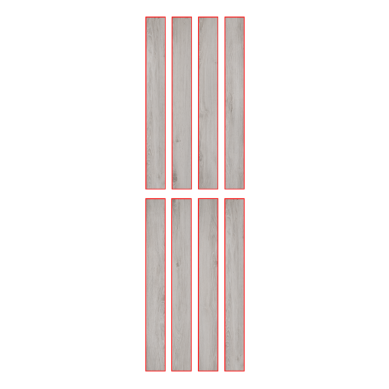

../data/floor\88657712_03.jpg
no alpha channel


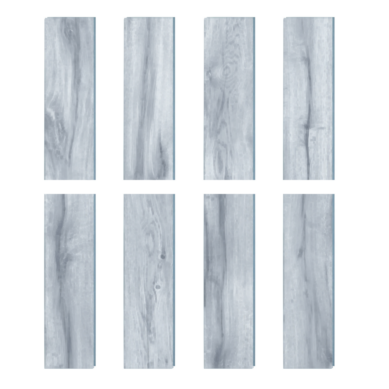

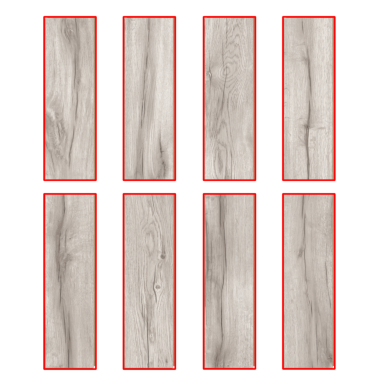

../data/floor\88657713_03.jpg
no alpha channel


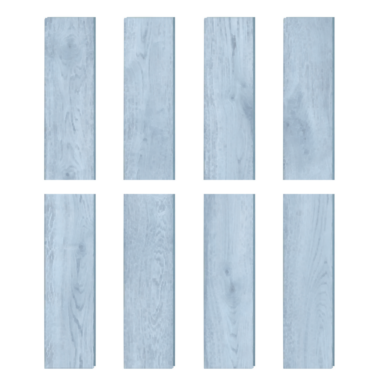

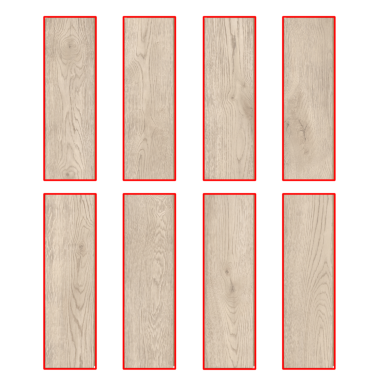

../data/floor\88657714_03.jpg
no alpha channel


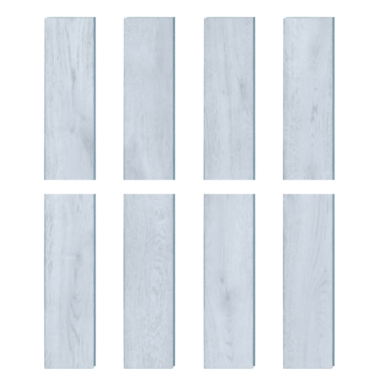

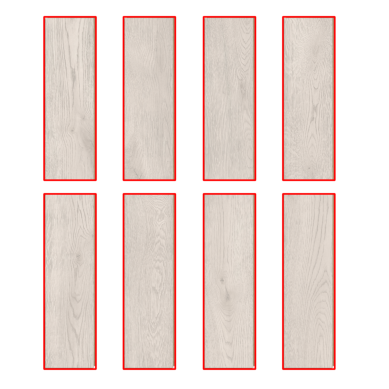

../data/floor\89353949_05.png
alpha channel


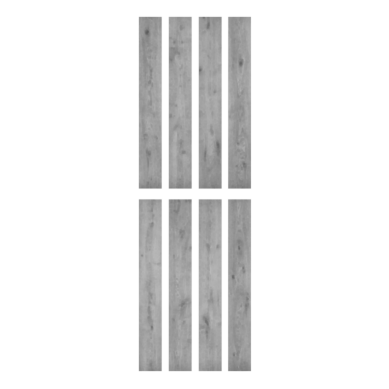

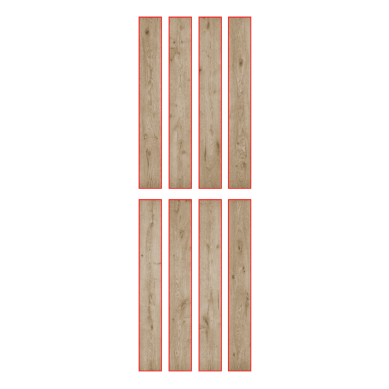

../data/floor\89395117_04.png
alpha channel


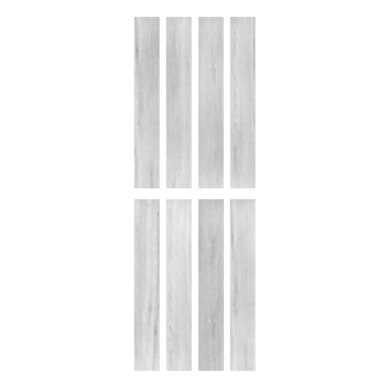

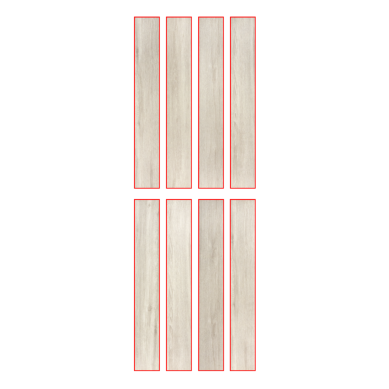

../data/floor\89395118_04.png
alpha channel


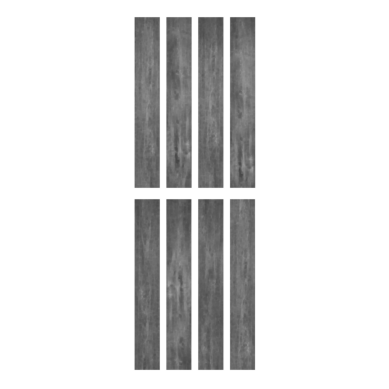

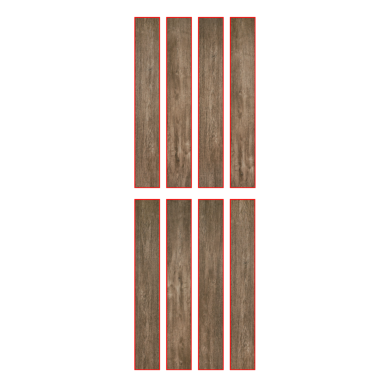

../data/floor\89395119_04.png
alpha channel


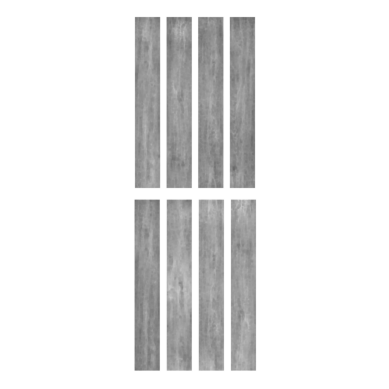

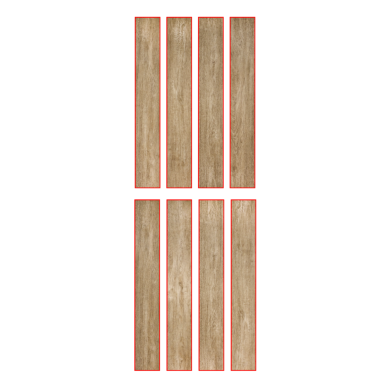

../data/floor\89395120_04.png
alpha channel


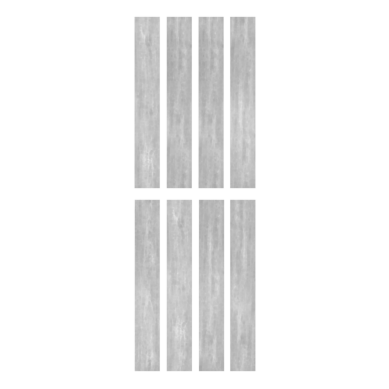

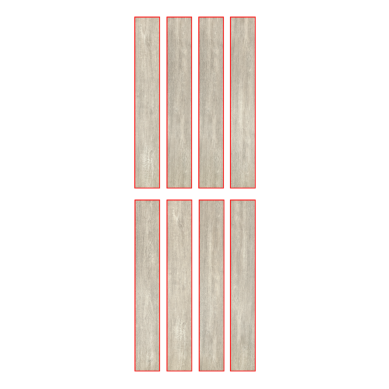

../data/floor\89395121_04.png
alpha channel


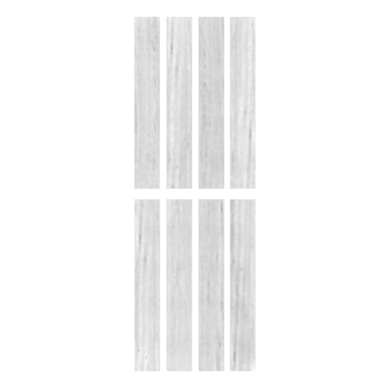

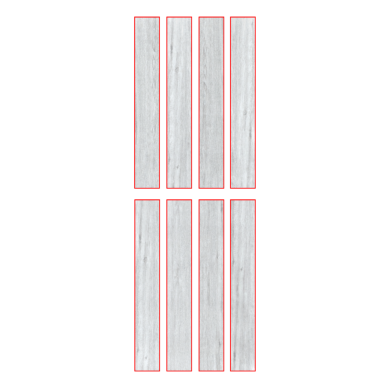

../data/floor\89395122_04.png
alpha channel


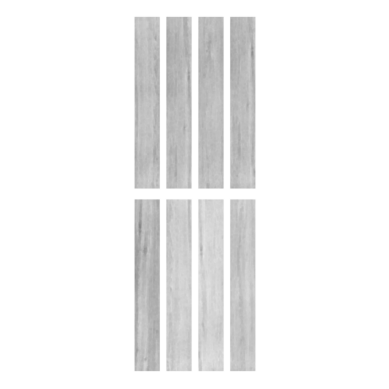

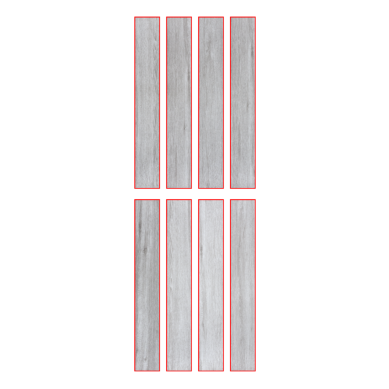

../data/floor\89395123_04.png
alpha channel


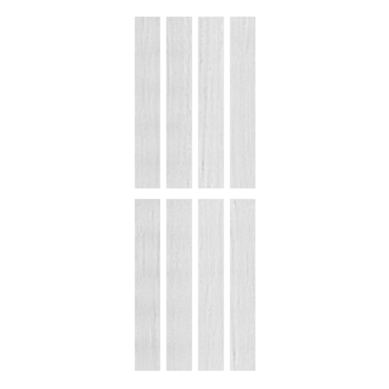

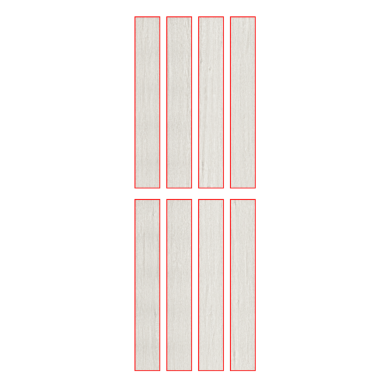

../data/floor\89395124_04.png
alpha channel


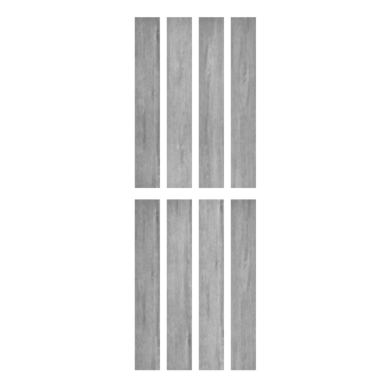

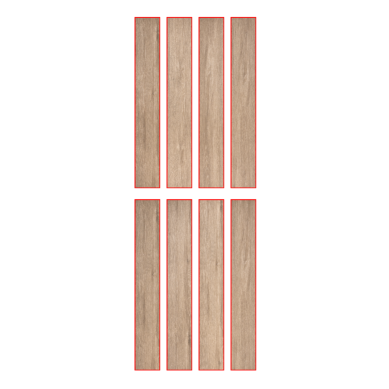

../data/floor\89411755_04.png
alpha channel


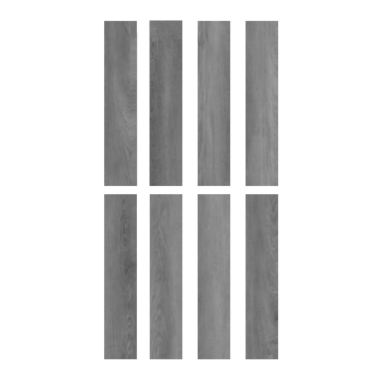

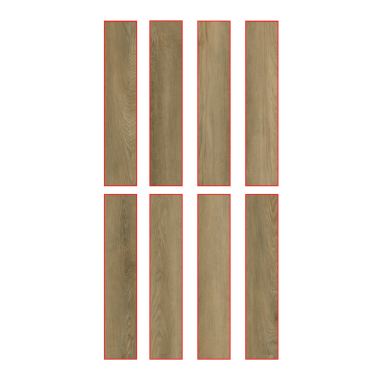

../data/floor\89411756_04.png
alpha channel


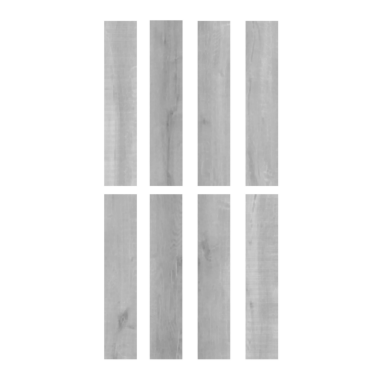

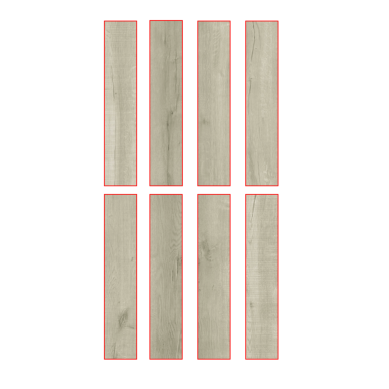

../data/floor\89411757_04.png
alpha channel


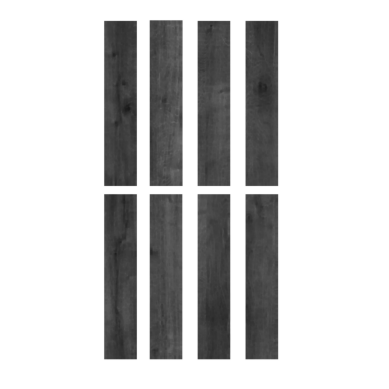

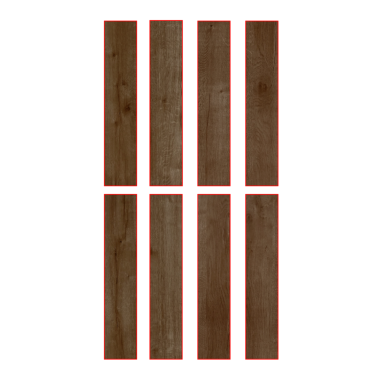

../data/floor\89411758_04.png
alpha channel


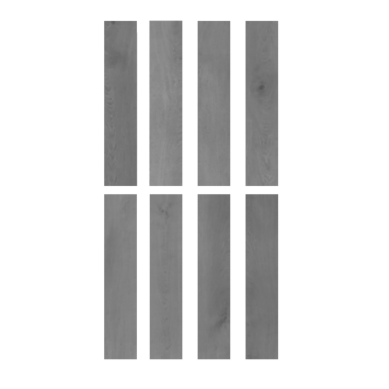

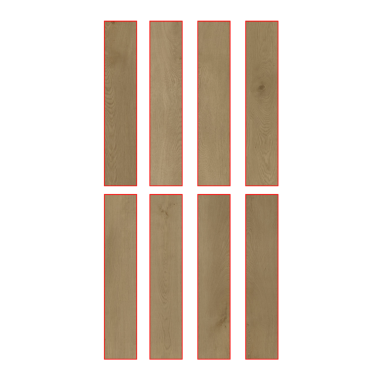

../data/floor\89418625_06.png
alpha channel


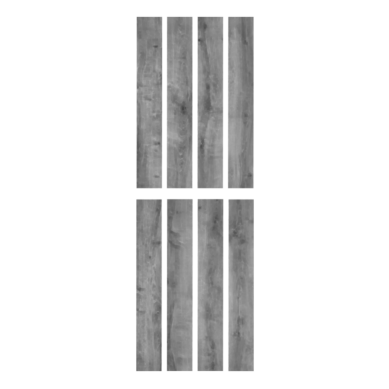

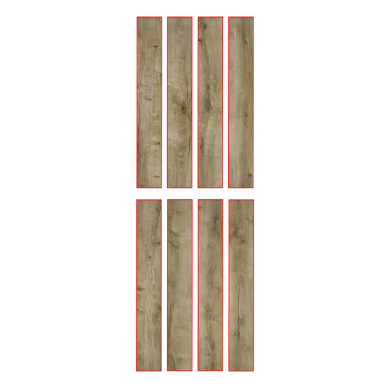

../data/floor\89418626_04.png
alpha channel


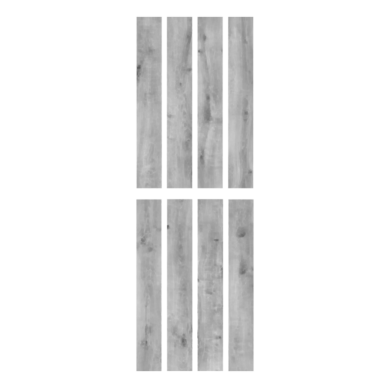

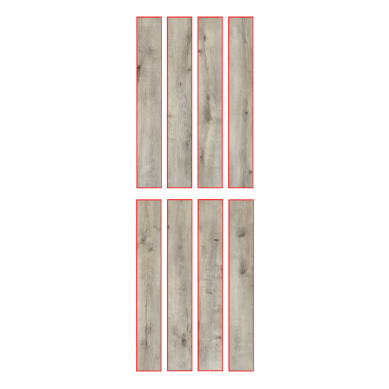

../data/floor\89418627_05.png
alpha channel


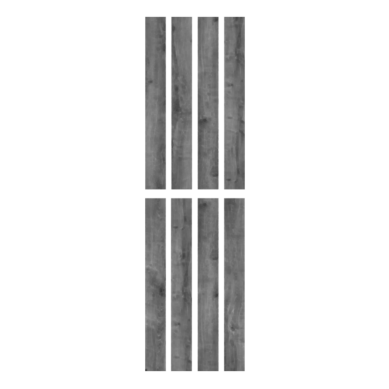

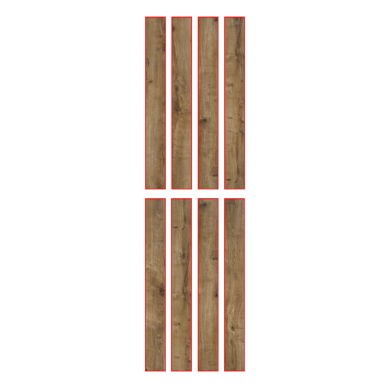

../data/floor\91001585_06.jpg
no alpha channel


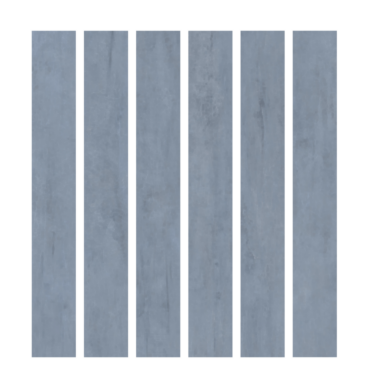

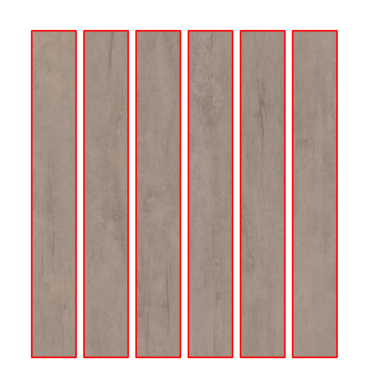

../data/floor\91001588_06.jpg
no alpha channel


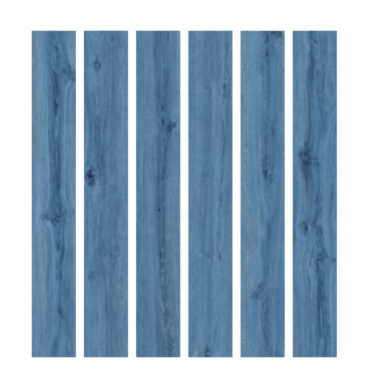

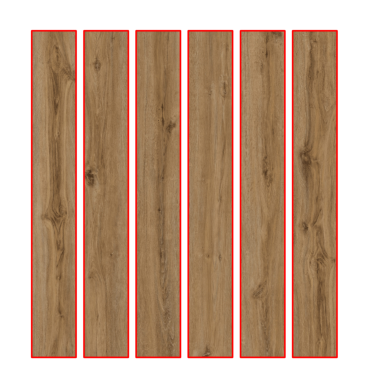

../data/floor\91001591_06.jpg
no alpha channel


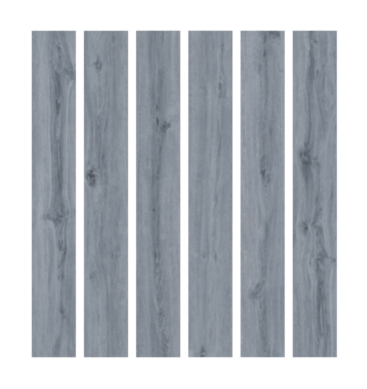

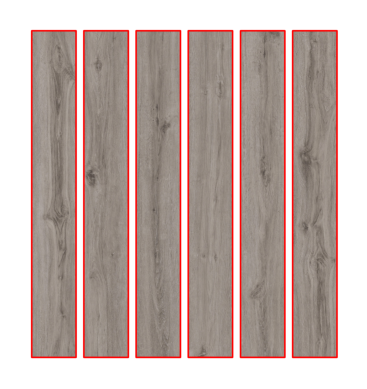

../data/floor\91001594_06.jpg
no alpha channel


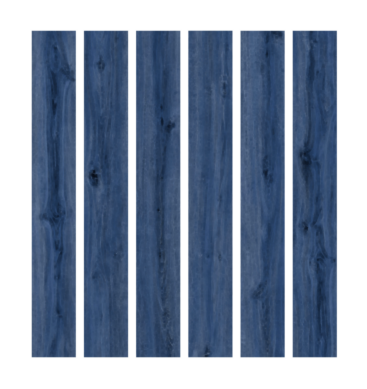

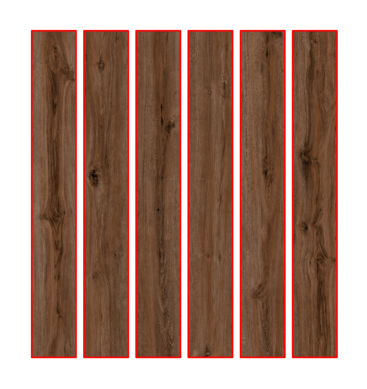

../data/floor\91001597_06.jpg
no alpha channel


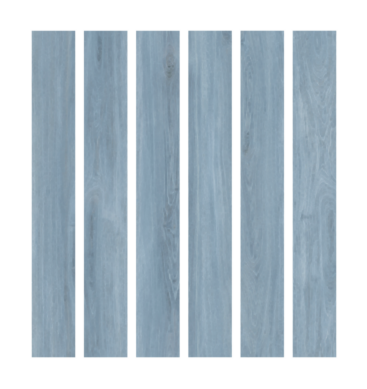

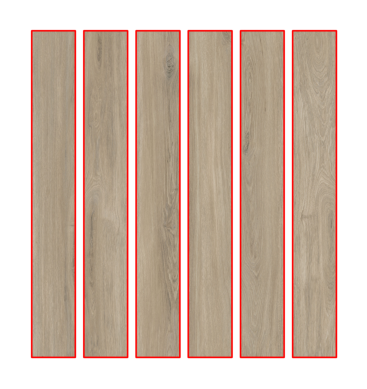

../data/floor\91001599_06.jpg
no alpha channel


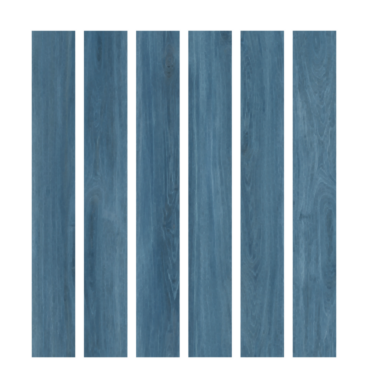

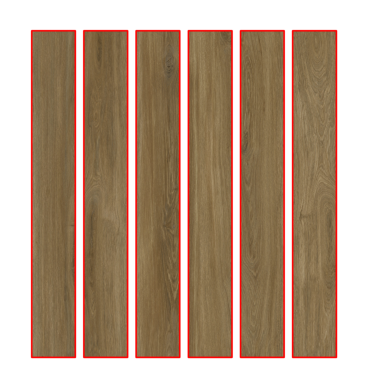

../data/floor\91638201_04.jpg
no alpha channel


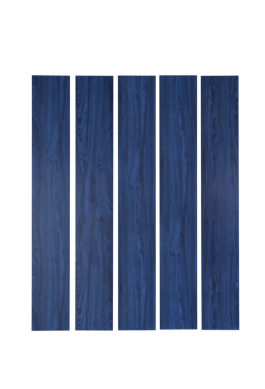

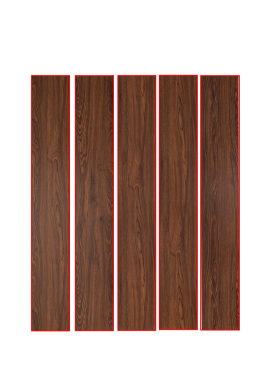

../data/floor\92264997_03.png
alpha channel


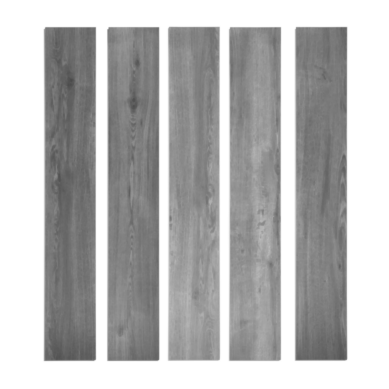

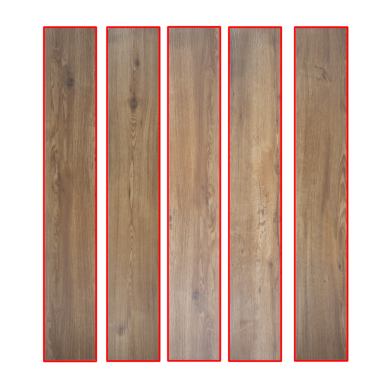

../data/floor\92264998_05.png
alpha channel


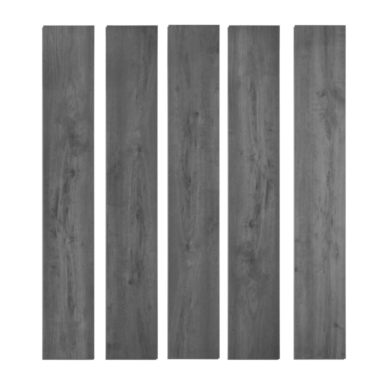

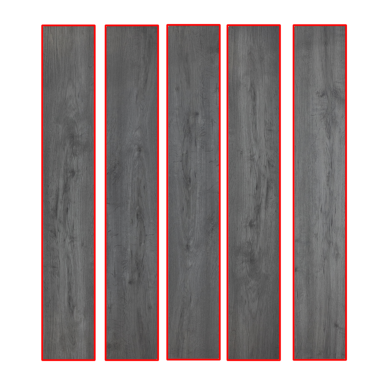

../data/floor\92264999_04.png
alpha channel


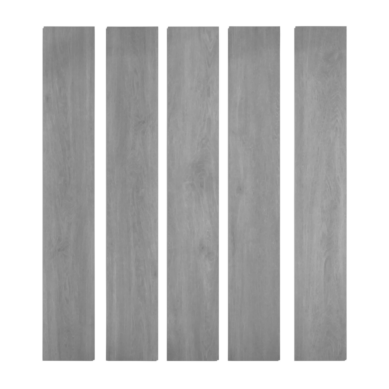

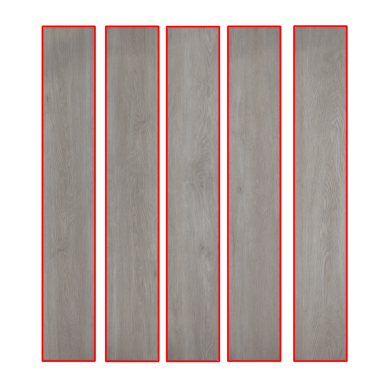

../data/floor\92265000_05.png
alpha channel


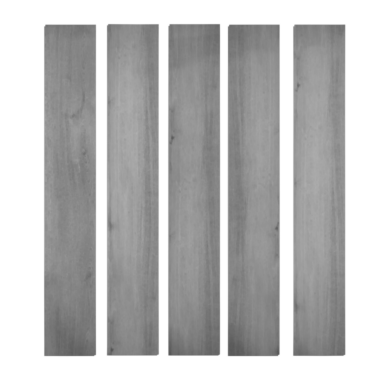

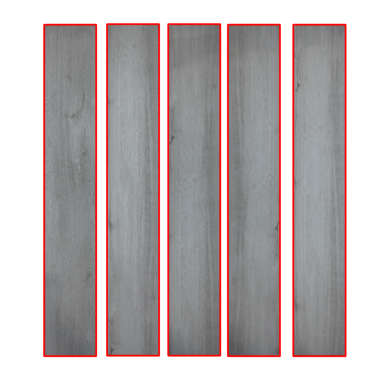

../data/floor\Aqua-Genius-Single-Panel-Photo-Bogota.jpg
no alpha channel


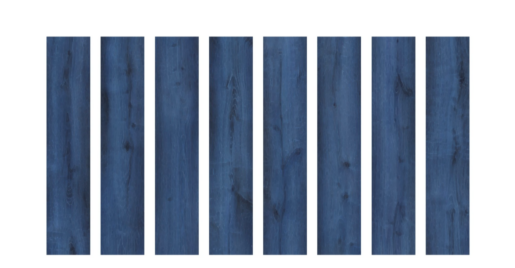

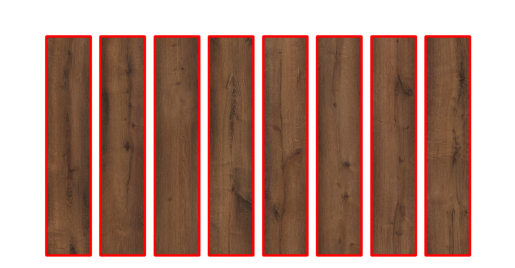

../data/floor\Aqua-Genius-Single-Panel-Photo-Brasilia.jpg
no alpha channel


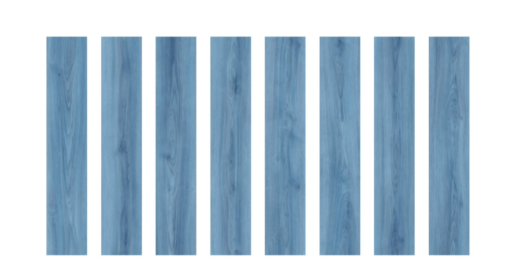

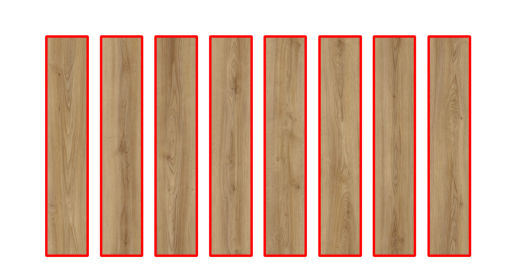

../data/floor\Aqua-Genius-Single-Panel-Photo-Cordoba.jpg
no alpha channel


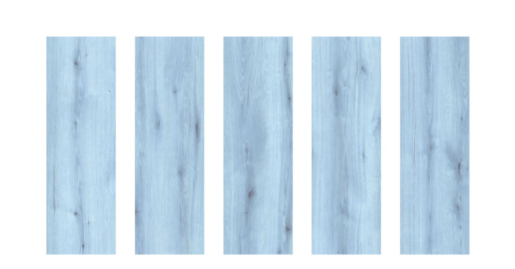

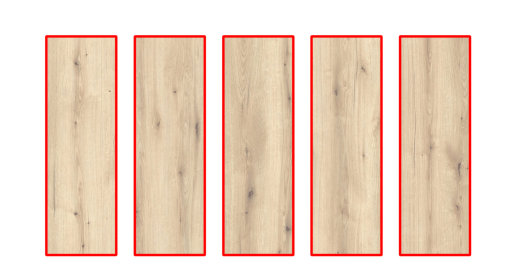

../data/floor\Aqua-Genius-Single-Panel-Photo-Lima.jpg
no alpha channel


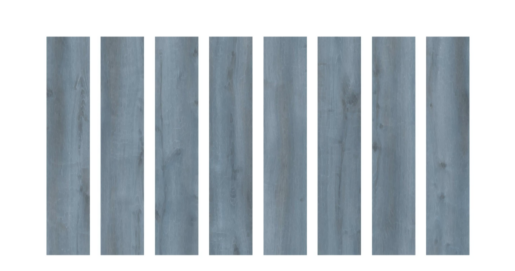

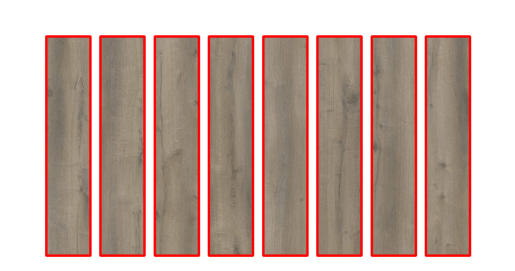

../data/floor\Aqua-Genius-Single-Panel-Photo-Rosario.jpg
no alpha channel


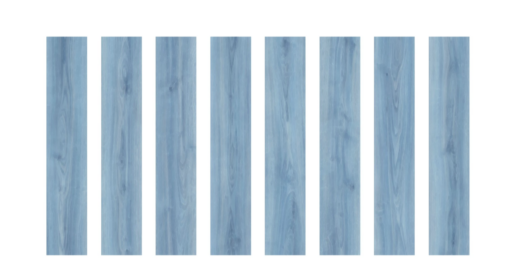

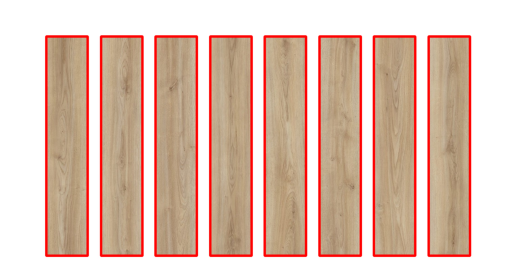

../data/floor\Aqua-Genius-Single-Panel-Photo-Salvador.jpg
no alpha channel


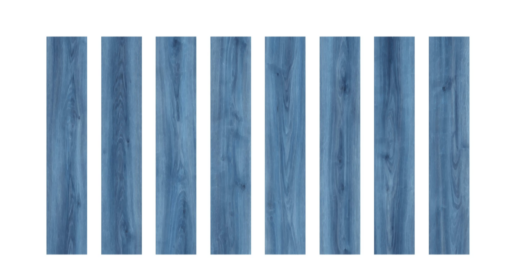

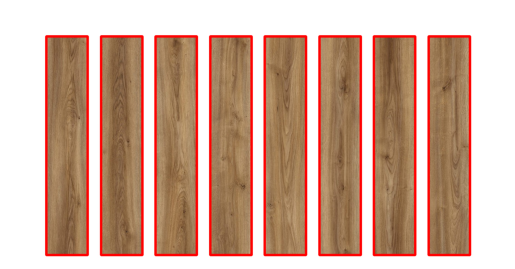

../data/floor\Aqua-Genius-Single-Panel-Photo-Santiago.jpg
no alpha channel


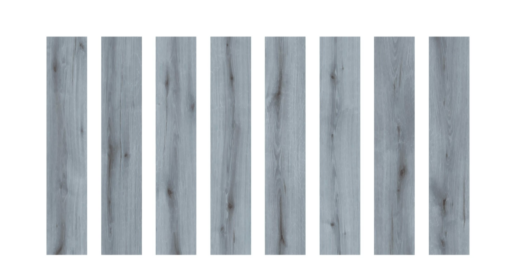

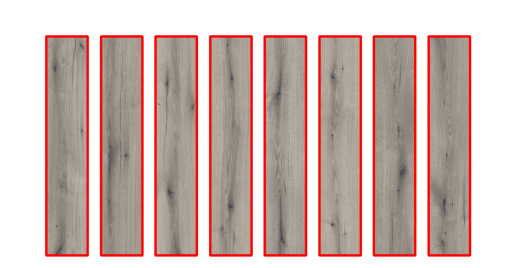

../data/floor\Aqua-Genius-Single-Panel-Photo-Sao-Paulo.jpg
no alpha channel


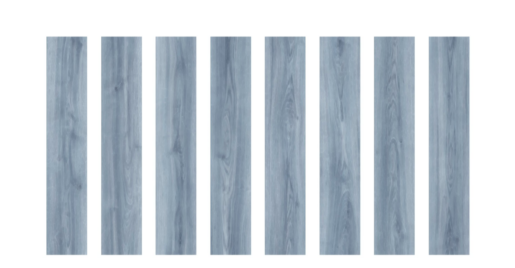

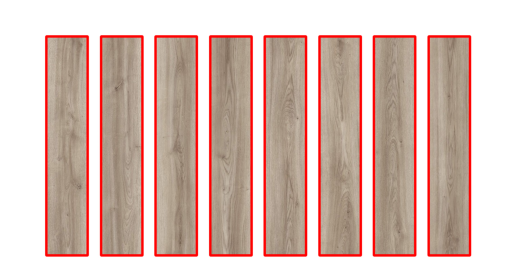

../data/floor\Aqua-Genius-Single-Panel-Photo-Valencia.jpg
no alpha channel


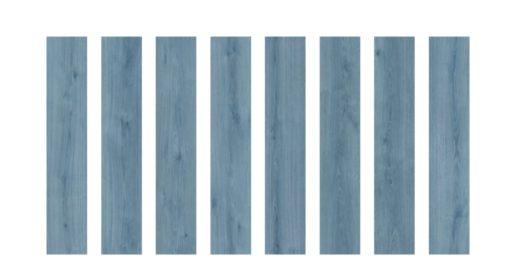

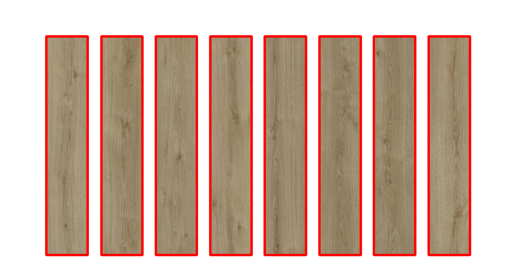

../data/floor\Euro-Loft-single-plank-Alps.jpg
no alpha channel


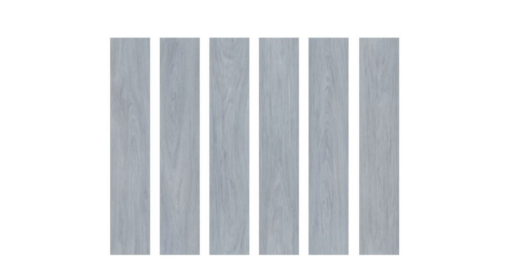

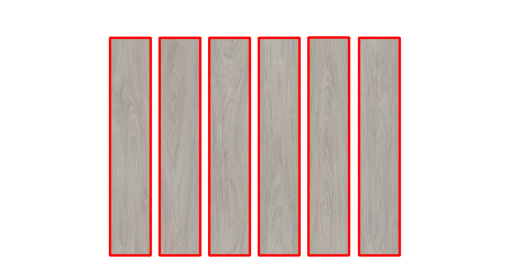

../data/floor\Euro-Loft-single-plank-Casa-Mila.jpg
no alpha channel


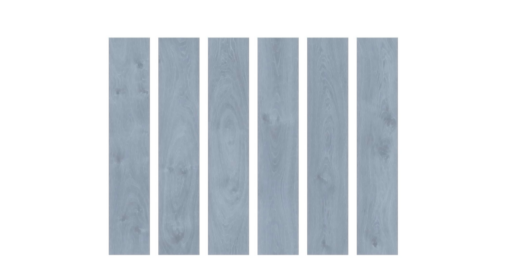

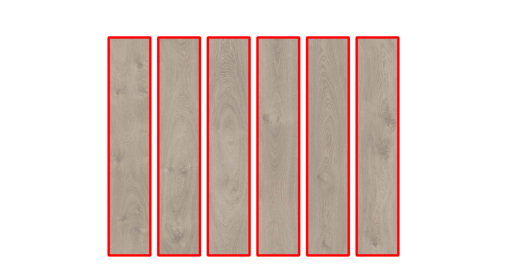

../data/floor\Euro-Loft-single-plank-Mozart_V2.jpg
no alpha channel


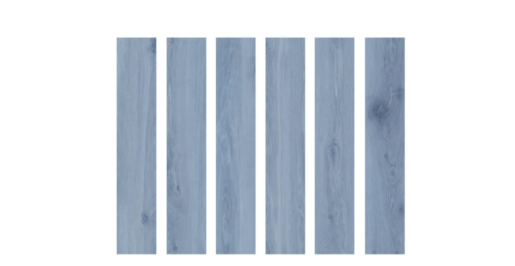

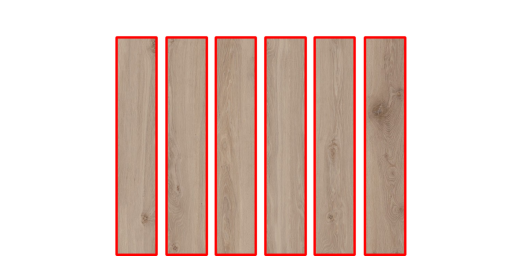

../data/floor\Euro-Loft-single-plank-New-Classic.jpg
no alpha channel


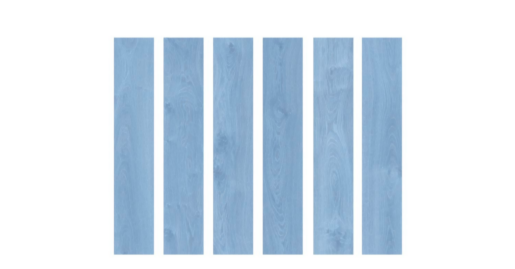

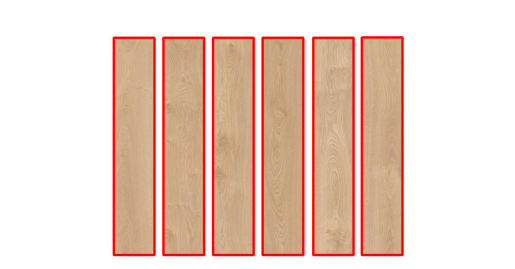

../data/floor\Euro-Loft-single-plank-Picasso.jpg
no alpha channel


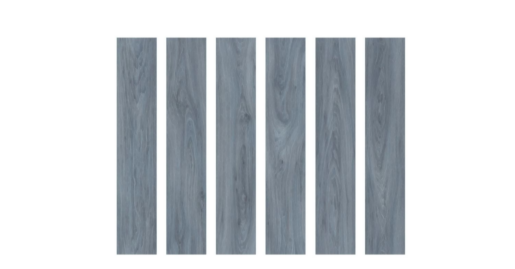

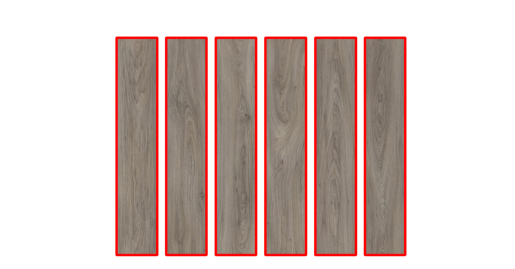

../data/floor\Euro-Loft-single-plank-Rosa.jpg
no alpha channel


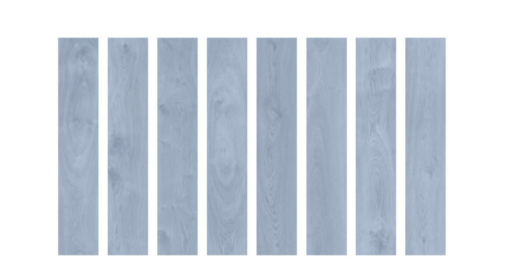

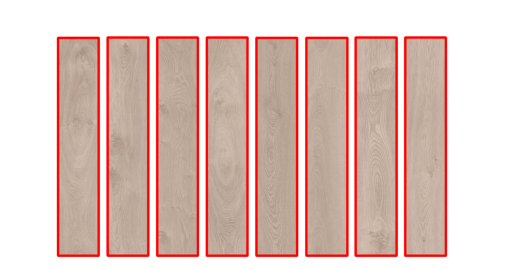

../data/floor\Euro-Loft-single-plank-Tokyo.jpg
no alpha channel


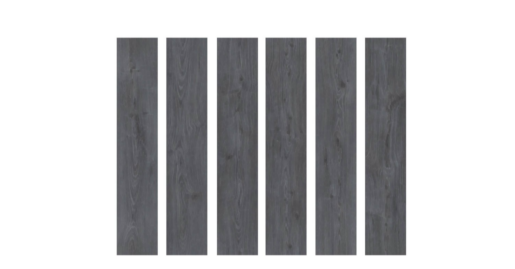

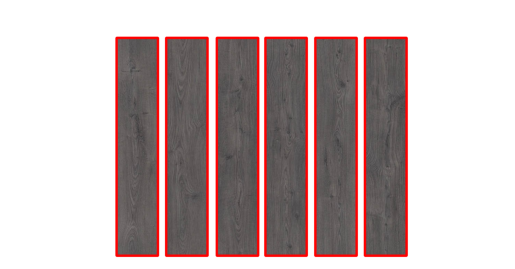

../data/floor\Roman-Parquet-single-plank-ariana-panel.jpg
no alpha channel


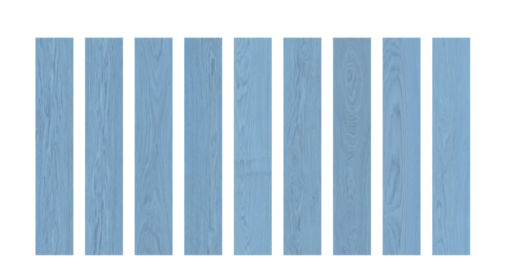

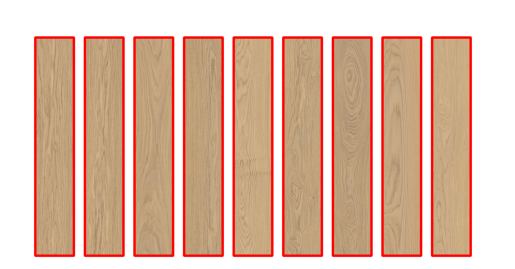

../data/floor\Roman-Parquet-single-plank-baggio-panel.jpg
no alpha channel


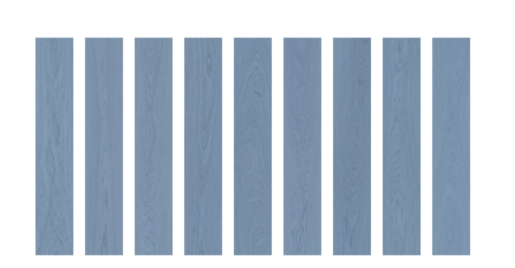

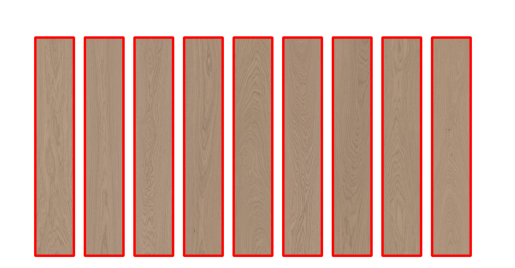

../data/floor\Roman-Parquet-single-plank-claudia-panel.jpg
no alpha channel


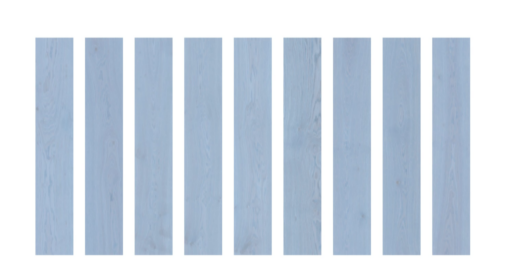

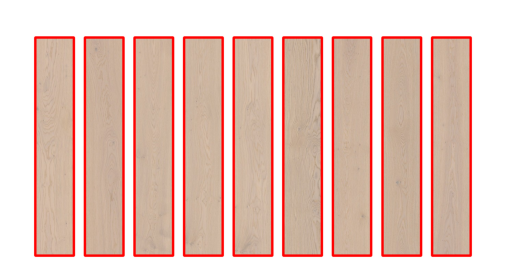

../data/floor\Roman-Parquet-single-plank-elia-panel.jpg
no alpha channel


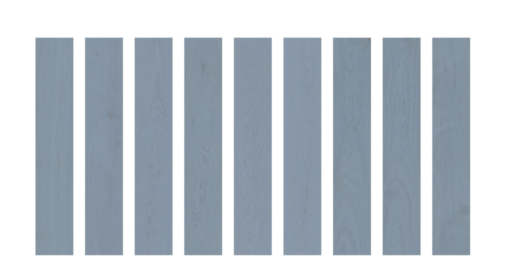

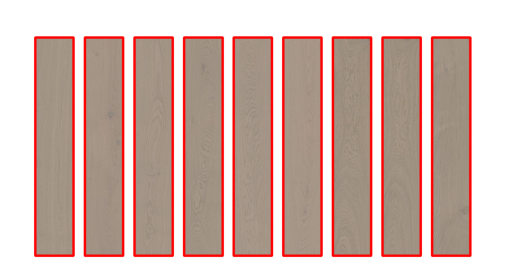

../data/floor\Roman-Parquet-single-plank-elvio-panel.jpg
no alpha channel


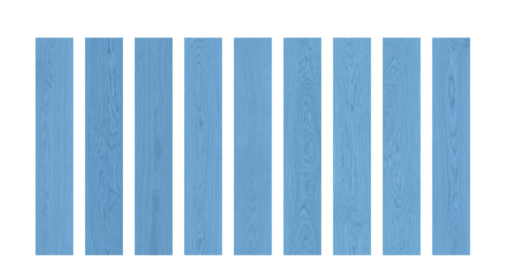

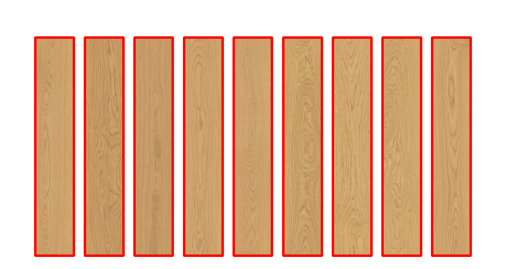

../data/floor\Roman-Parquet-single-plank-piero-panel.jpg
no alpha channel


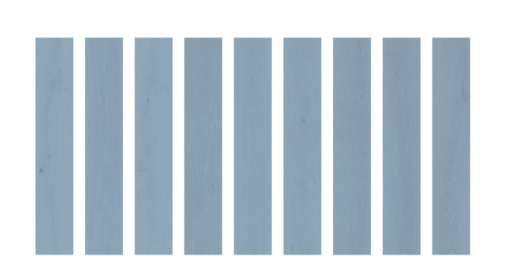

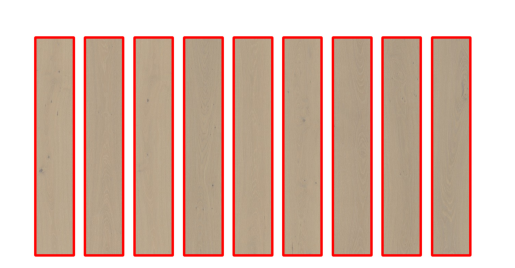

../data/floor\Roman-Parquet-single-plank-pirlo-panel.jpg
no alpha channel


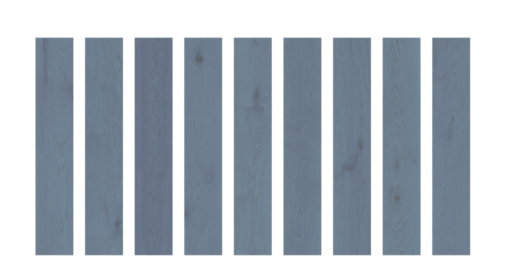

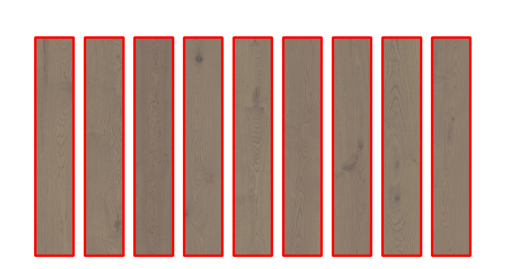

../data/floor\Roman-Parquet-single-plank-rossi-panel.jpg
no alpha channel


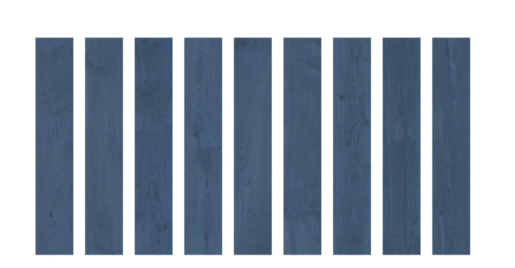

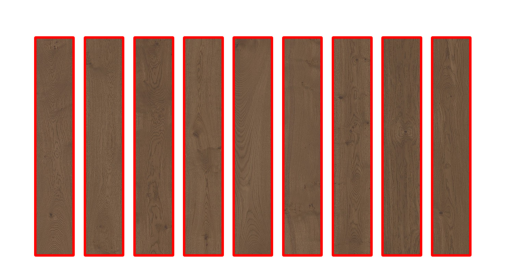

../data/floor\SA-single-panel-Heidi.jpg
no alpha channel


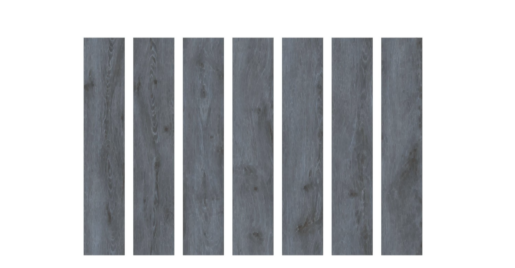

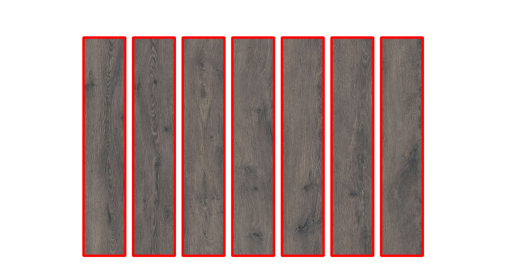

../data/floor\SA-single-panel-Lake-Lucerne.jpg
no alpha channel


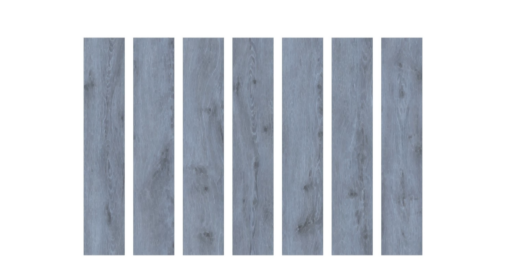

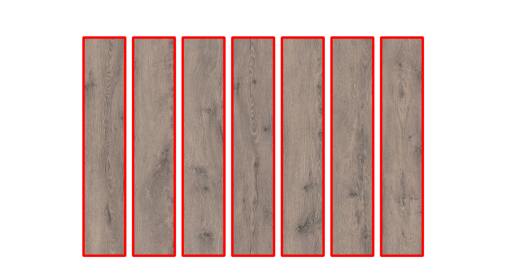

../data/floor\SA-single-panel-Limewashed-Oak.jpg
no alpha channel


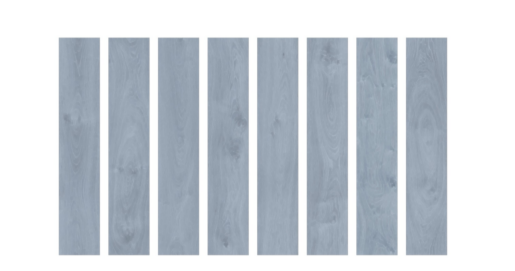

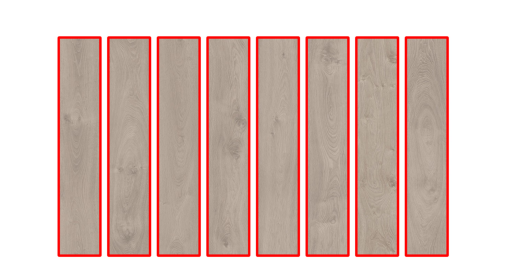

../data/floor\SA-single-panel-Mr.-Grey.jpg
no alpha channel


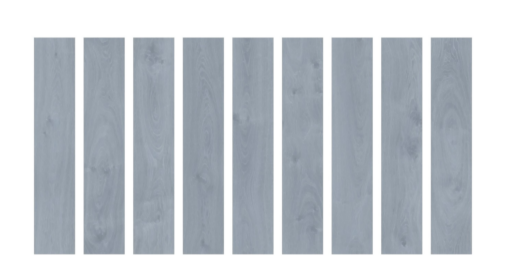

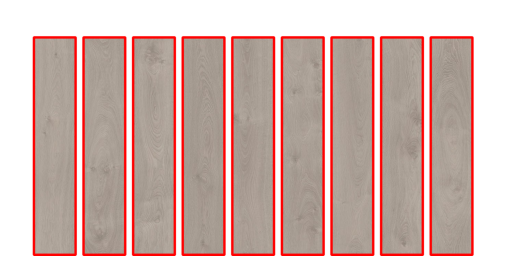

../data/floor\SA-single-panel-Shadow.jpg
no alpha channel


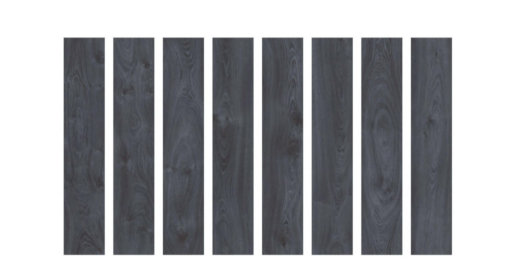

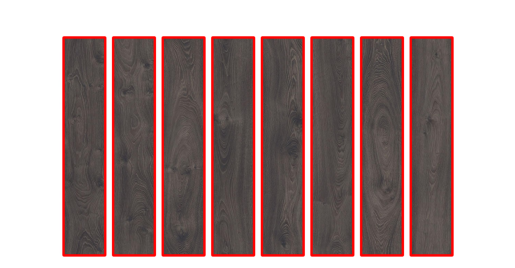

../data/floor\SA-single-panel-Solar.jpg
no alpha channel


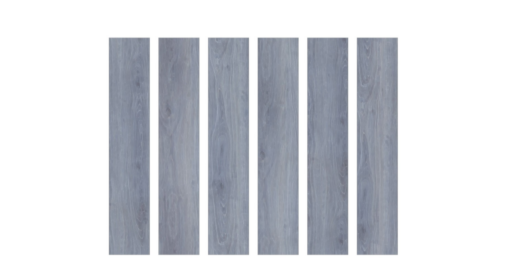

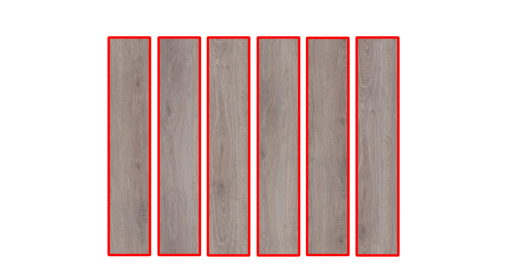

../data/floor\SA-single-panel-Victoria.jpg
no alpha channel


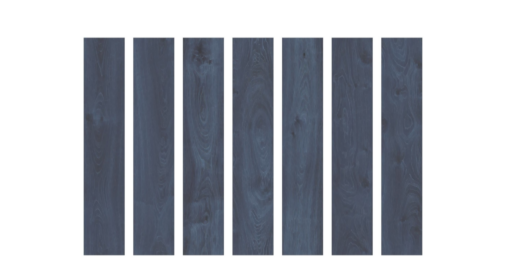

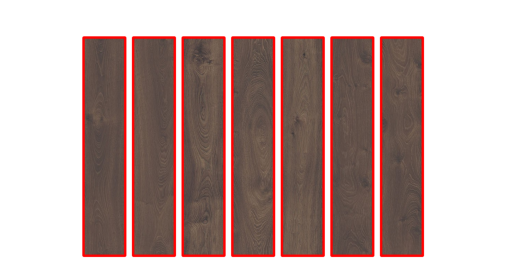

../data/floor\UG-single-plank-European-Walnut.jpg
no alpha channel


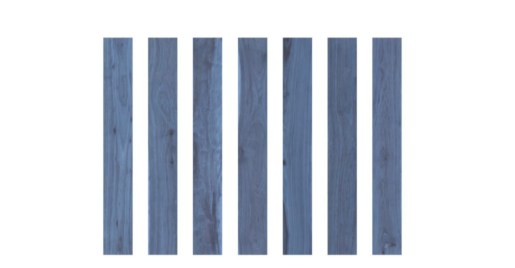

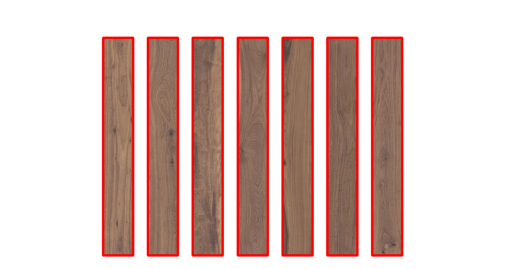

../data/floor\UG-single-plank-Oak-Alabaster.jpg
no alpha channel


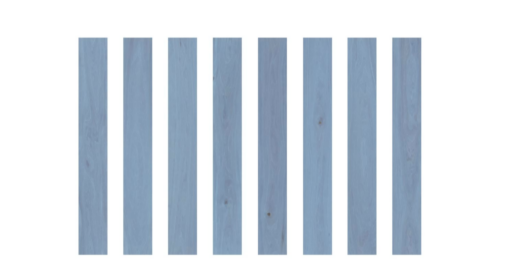

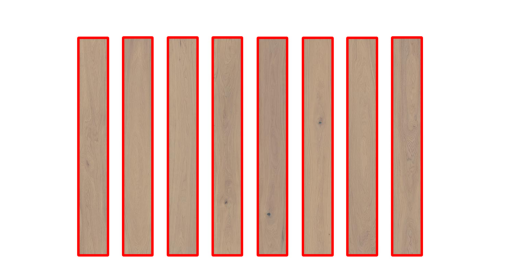

../data/floor\UG-single-plank-Oak-Brooklyn-Grey.jpg
no alpha channel


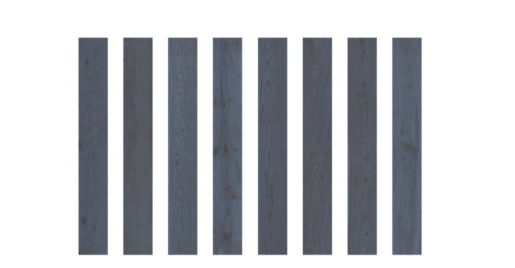

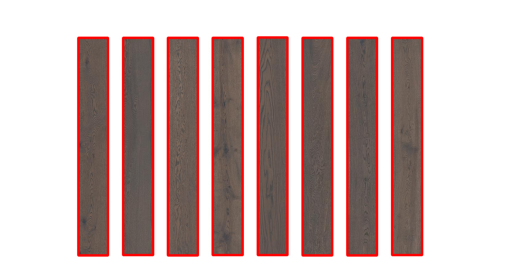

../data/floor\UG-single-plank-Oak-Creama.jpg
no alpha channel


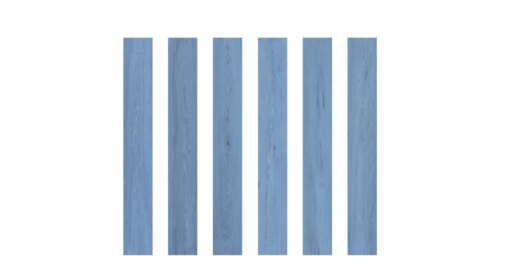

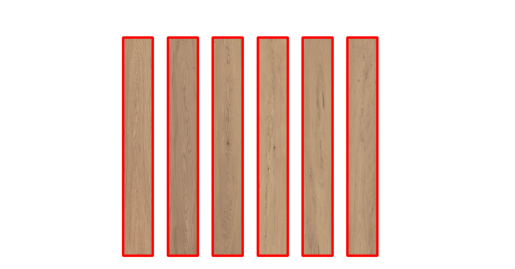

../data/floor\UG-single-plank-Oak-Monet.jpg
no alpha channel


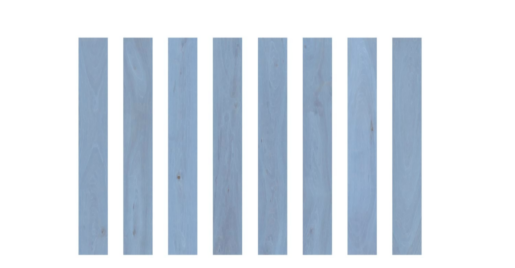

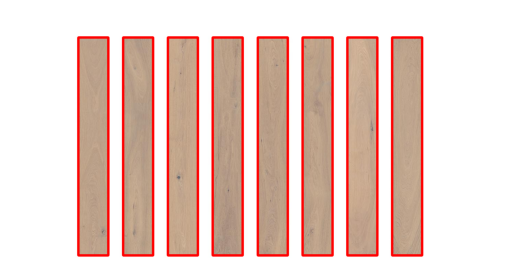

../data/floor\UG-single-plank-Oak-Oasis.jpg
no alpha channel


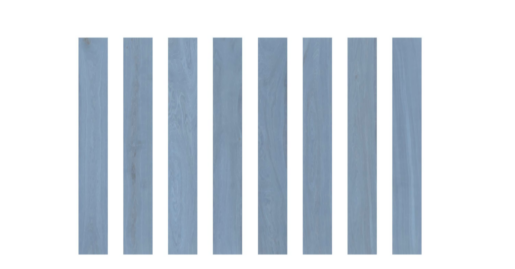

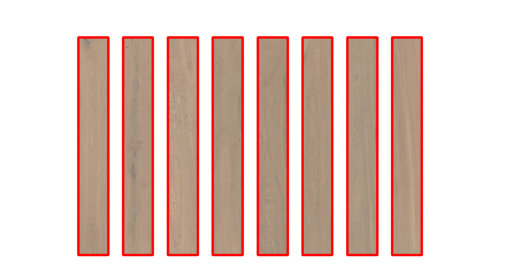

../data/floor\UG-single-plank-Oak-Original.jpg
no alpha channel


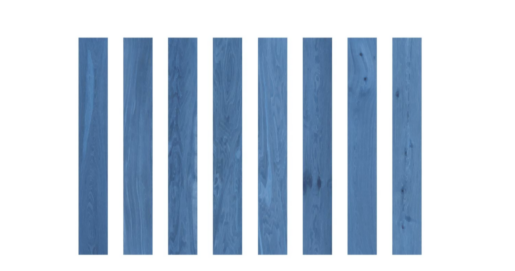

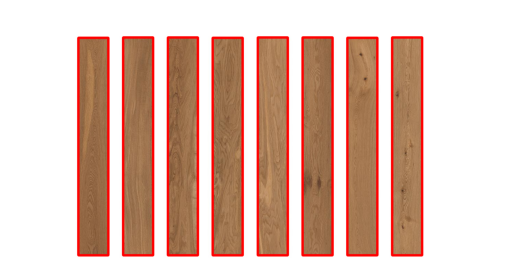

../data/floor\UG-single-plank-Oak-Sakura.jpg
no alpha channel


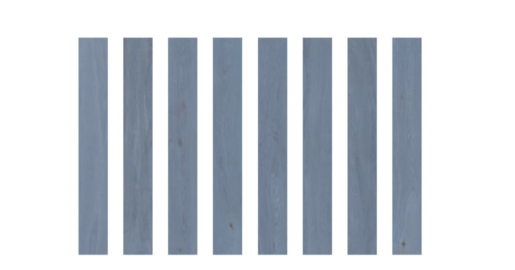

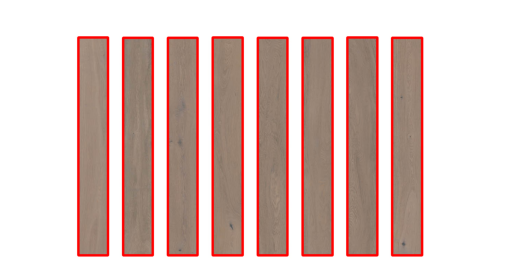

../data/floor\UG-single-plank-Oak-Vancouver.jpg
no alpha channel


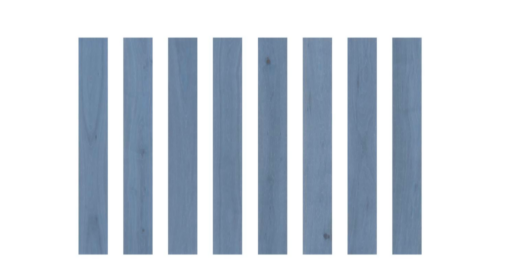

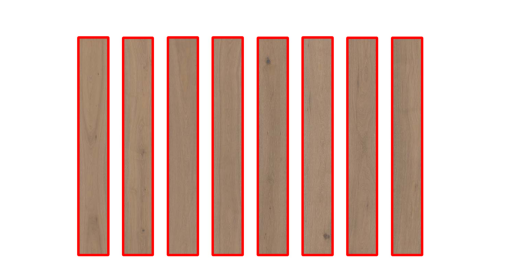

../data/floor\UG-single-plank-Walnut-Royal.jpg
no alpha channel


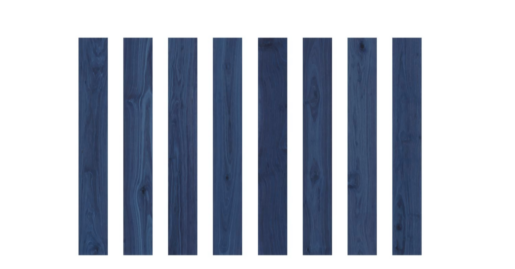

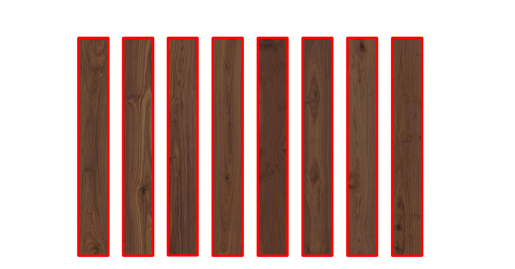

In [35]:
import os

input_folder = '../data/floor'
output_folder = '../data/laminate_boards'

# Make an output directory
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Look for all files in the dataset and extract boards
for filename in os.listdir(input_folder):
    if filename.endswith('.webp') or filename.endswith('.png') or filename.endswith('.jpg'):
        file_path = os.path.join(input_folder, filename)
        print(file_path)
        boards = extract_boards(file_path)
        for i, board in enumerate(boards):
            output_filename = f'{os.path.splitext(filename)[0]}_board_{i}.png'
            cv2.imwrite(os.path.join(output_folder, output_filename), board)